In [1]:
import cv2
import numpy as np

##### Image Translation / Shifting

In [2]:
img = cv2.imread('images/sachin.jpg')

In [5]:
# get the shape
height, width, _ = img.shape

In [6]:
quarter_height, quarter_width = height//4, width//4

In [10]:
T = np.float32([[1, 0, quarter_width],[0, 1, quarter_height]])

In [11]:
T

array([[  1.,   0., 212.],
       [  0.,   1., 268.]], dtype=float32)

In [12]:
img_trans = cv2.warpAffine(img, T, (width, height))

In [13]:
cv2.imshow('translated image', img_trans)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [14]:
T = np.float32([[1, 0, 50],[0, 1, 100]])

In [15]:
img_trans = cv2.warpAffine(img, T, (width, height))
cv2.imshow('translated image', img_trans)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [16]:
T = np.float32([[1, 0, -50],[0, 1, -100]])

In [17]:
img_trans = cv2.warpAffine(img, T, (width, height))
cv2.imshow('translated image', img_trans)
cv2.waitKey(0)
cv2.destroyAllWindows()

##### Image Rotation

In [19]:
img_rot = cv2.rotate(img, cv2.ROTATE_180)

In [20]:
cv2.imshow('rotated image', img_rot)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [22]:
img_rot = cv2.rotate(img, cv2.ROTATE_90_CLOCKWISE)
cv2.imshow('rotated image', img_rot)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [23]:
# get the center value
center = img.shape[1] // 2, img.shape[0] // 2

In [24]:
center

(425, 537)

In [28]:
# create the rotation matrix (center, angle, scale)
angle = 60
rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)

In [30]:
# create the rotated image
rotated_image = cv2.warpAffine(img, rotation_matrix, (width, height))

In [31]:
cv2.imshow('rotated image', rotated_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [36]:
# create the rotation matrix (center, angle, scale)
angle = 60
rotation_matrix = cv2.getRotationMatrix2D((500,500), 75, 1.0)

In [37]:
# create the rotated image
rotated_image = cv2.warpAffine(img, rotation_matrix, (800, 800))

In [38]:
cv2.imshow('rotated image', rotated_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [39]:
rotation_matrix = cv2.getRotationMatrix2D((500,500), -50, 1.0)

In [40]:
# create the rotated image
rotated_image = cv2.warpAffine(img, rotation_matrix, (800, 800))
cv2.imshow('rotated image', rotated_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

##### Rotation using PIL

In [42]:
from PIL import Image

In [43]:
img_pil = Image.open('images/sachin.jpg')

In [44]:
rot_img = img_pil.transpose(Image.ROTATE_90)

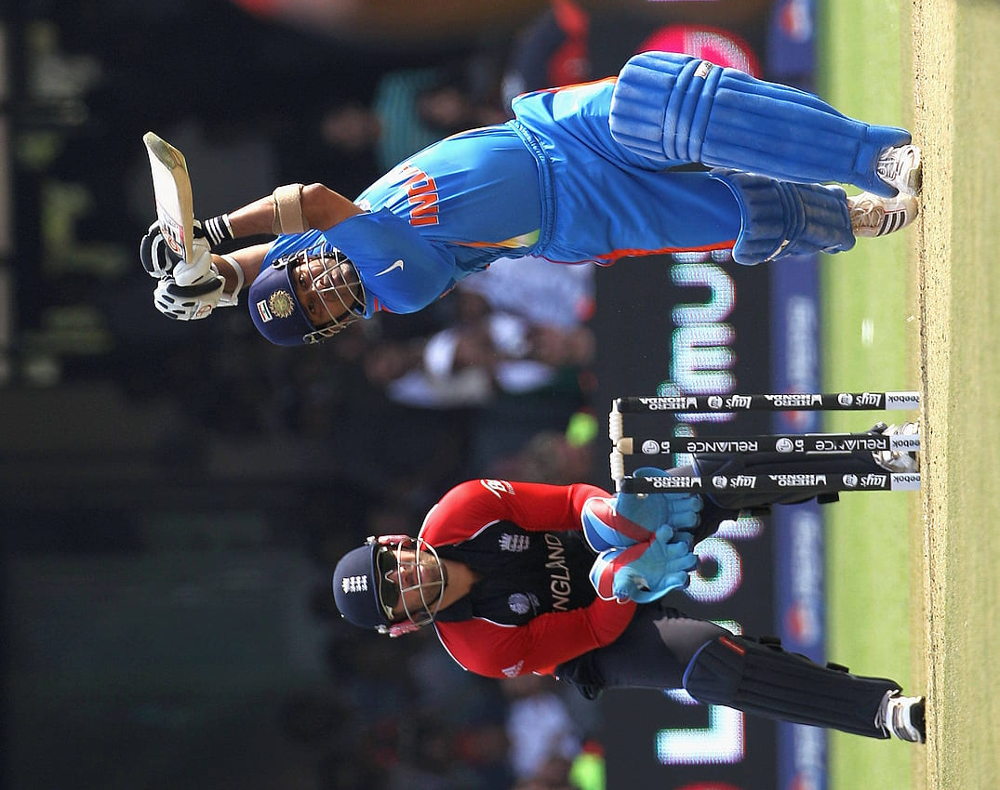

In [45]:
rot_img

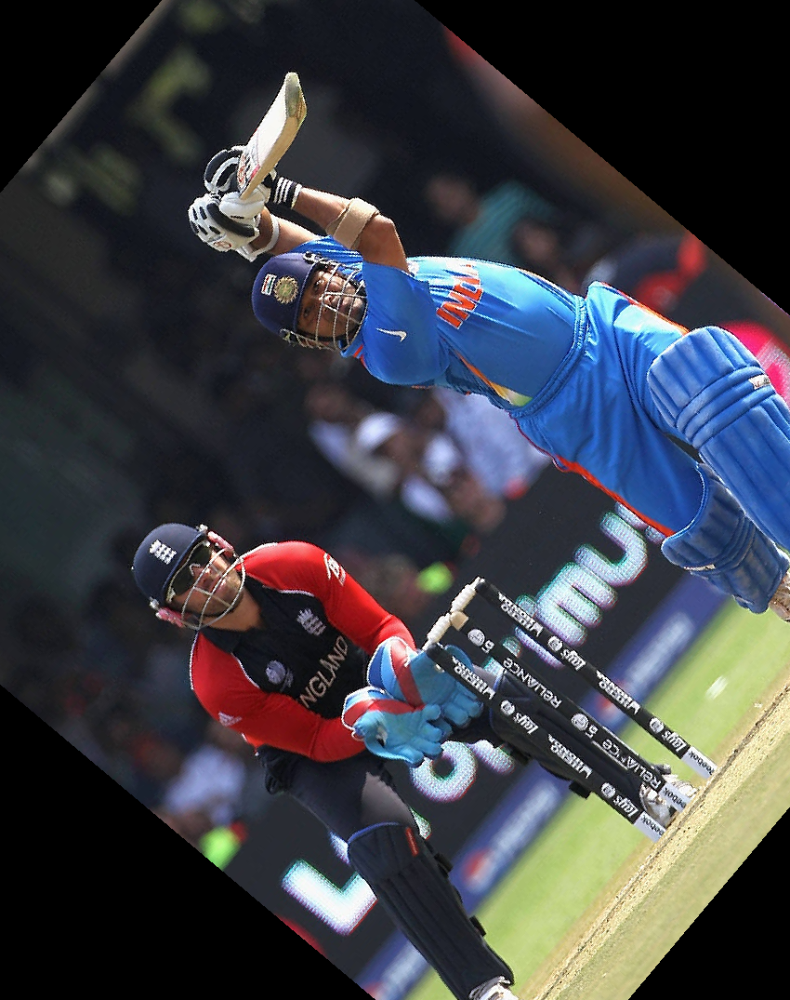

In [46]:
img_pil.rotate(50)

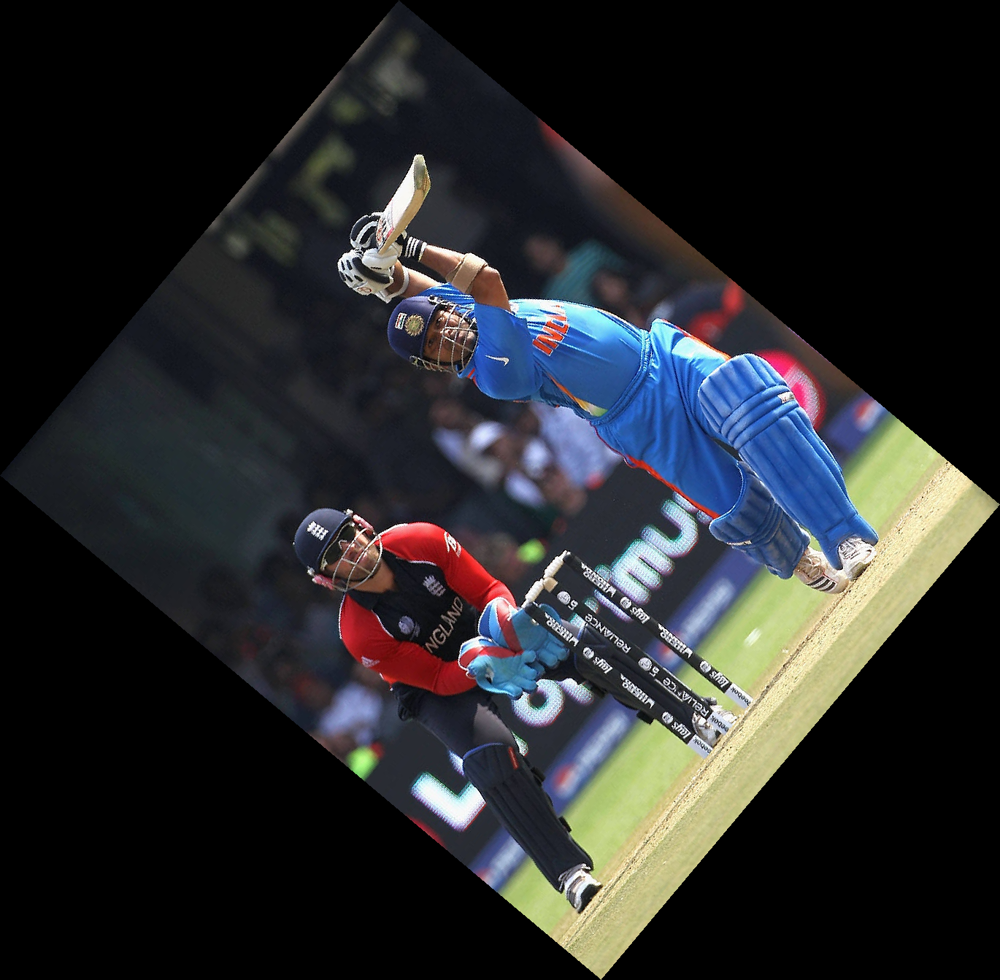

In [47]:
img_pil.rotate(50, expand=True)

##### Image Resizing

In [49]:
help(cv2.resize)

Help on built-in function resize:

resize(...)
    resize(src, dsize[, dst[, fx[, fy[, interpolation]]]]) -> dst
    .   @brief Resizes an image.
    .   
    .   The function resize resizes the image src down to or up to the specified size. Note that the
    .   initial dst type or size are not taken into account. Instead, the size and type are derived from
    .   the `src`,`dsize`,`fx`, and `fy`. If you want to resize src so that it fits the pre-created dst,
    .   you may call the function as follows:
    .   @code
    .       // explicitly specify dsize=dst.size(); fx and fy will be computed from that.
    .       resize(src, dst, dst.size(), 0, 0, interpolation);
    .   @endcode
    .   If you want to decimate the image by factor of 2 in each direction, you can call the function this
    .   way:
    .   @code
    .       // specify fx and fy and let the function compute the destination image size.
    .       resize(src, dst, Size(), 0.5, 0.5, interpolation);
    .   @endcode


In [52]:
resized_image = cv2.resize(img, (500,700))

In [53]:
cv2.imshow('resized image', resized_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

##### Image Scaling

In [56]:
rescaled_image = cv2.resize(img, None, fx=0.5, fy=0.5)

In [57]:
cv2.imshow('resized image', rescaled_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [59]:
rescaled_image = cv2.resize(img, None, fx=1.75, fy=0.80)

cv2.imshow('resized image', rescaled_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [60]:
rescaled_image.shape

(860, 1488, 3)

In [61]:
resized_image.shape

(538, 425, 3)

##### Resizing using PIL

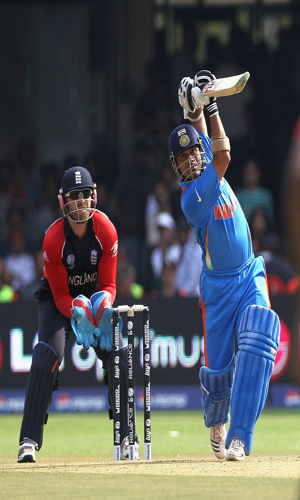

In [64]:
img_pil.resize((300,500))

##### Resizing using skimage

In [68]:
from skimage.transform import resize
import matplotlib.pyplot as plt

In [69]:
img_ski = plt.imread('images/sachin.jpg')

In [72]:
res_img = resize(img_ski, (400,250))

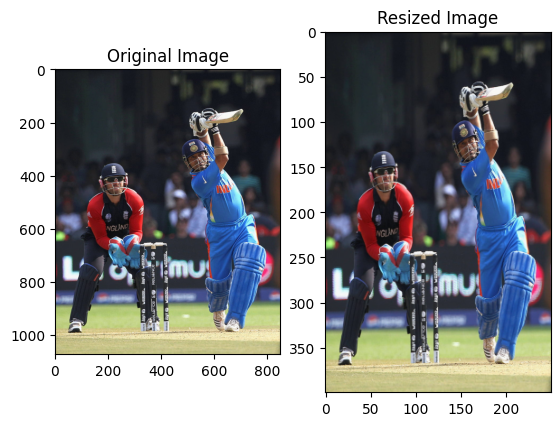

In [73]:
plt.subplot(1,2,1)
plt.title('Original Image')
plt.imshow(img_ski)
plt.subplot(1,2,2)
plt.title('Resized Image')
plt.imshow(res_img)

##### Image flipping

In [81]:
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# horizontal flip
fip_hor = cv2.flip(img_rgb, 0)

# vertical flip
fip_ver = cv2.flip(img_rgb, 1)

# diagonal flip
fip_dia = cv2.flip(img_rgb, -1)

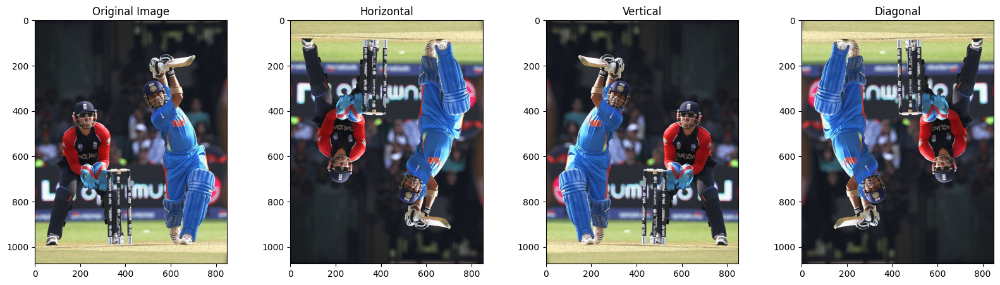

In [82]:
plt.figure(figsize=(20,5))
plt.subplot(1,4,1)
plt.title('Original Image')
plt.imshow(img_rgb)
plt.subplot(1,4,2)
plt.title('Horizontal')
plt.imshow(fip_hor)
plt.subplot(1,4,3)
plt.title('Vertical')
plt.imshow(fip_ver)
plt.subplot(1,4,4)
plt.title('Diagonal')
plt.imshow(fip_dia)

##### Image cropping

In [85]:
height, width, _ = img_rgb.shape

In [86]:
startRow = int(height*0.15)
startCol = int(width*0.15)
endRow = int(height*0.85)
endCol = int(width*0.85)

In [87]:
croppedImage = img_rgb[startRow:endRow, startCol:endCol]

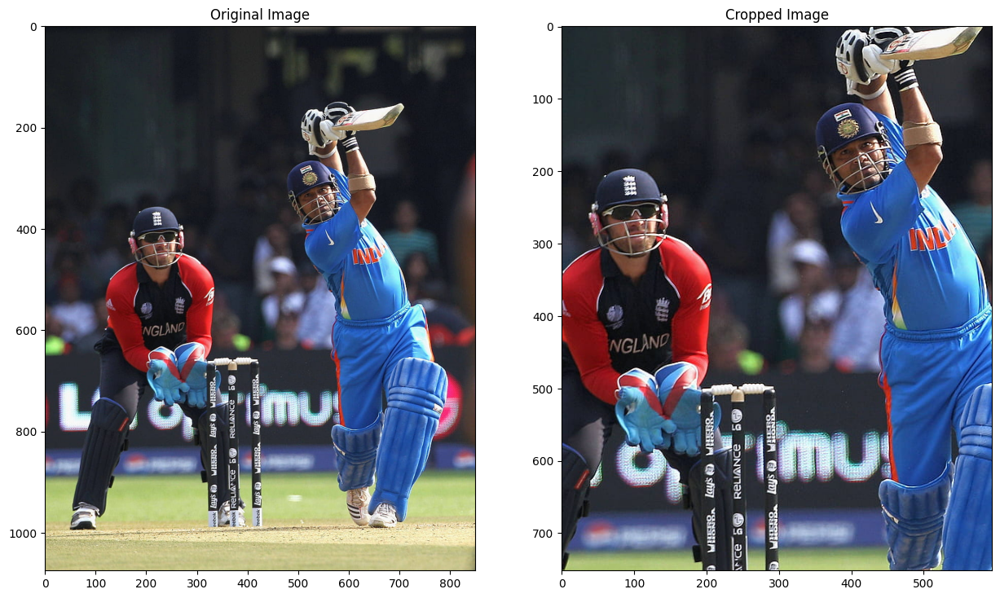

In [90]:
plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
plt.title('Original Image')
plt.imshow(img_rgb)
plt.subplot(1,2,2)
plt.title('Cropped Image')
plt.imshow(croppedImage)

In [91]:
croppedImage = img_rgb[100:500, 150:600]

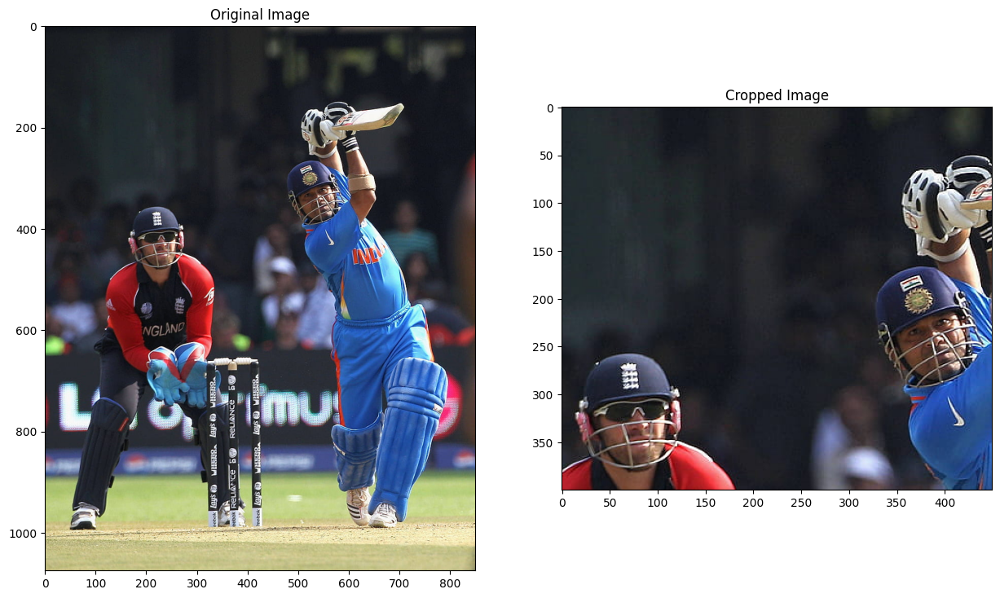

In [92]:
plt.figure(figsize=(15,10))
plt.subplot(1,2,1)
plt.title('Original Image')
plt.imshow(img_rgb)
plt.subplot(1,2,2)
plt.title('Cropped Image')
plt.imshow(croppedImage)

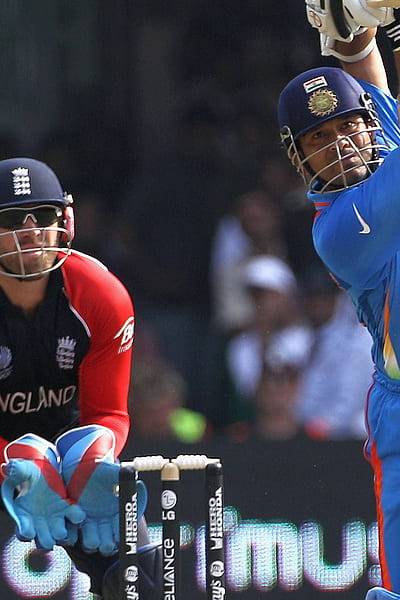

In [94]:
img_pil.crop((200,200,600,800))

##### Image Shearing

In [100]:
shear_x = 0.25   # shearing on x-axis
shear_y = 0.40   # shearing on y-axis

M = np.array([[1, shear_x, 0],
              [shear_y, 1, 0],
              [0, 0, 1]])

In [97]:
M

array([[1.  , 0.25, 0.  ],
       [0.4 , 1.  , 0.  ],
       [0.  , 0.  , 1.  ]])

In [98]:
img_shear = cv2.warpPerspective(img, M, (width, height))

In [99]:
cv2.imshow('sheared image', img_shear)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [101]:
shear_x = -0.25   # shearing on x-axis
shear_y = 0.40   # shearing on y-axis

M = np.array([[1, shear_x, 0],
              [shear_y, 1, 0],
              [0, 0, 1]])

img_shear = cv2.warpPerspective(img, M, (width, height))

cv2.imshow('sheared image', img_shear)
cv2.waitKey(0)
cv2.destroyAllWindows()

In [103]:
img_res = cv2.resize(img, (500,600))
img_shear = cv2.warpPerspective(img_res, M, (width, height))

cv2.imshow('sheared image', img_shear)
cv2.waitKey(0)
cv2.destroyAllWindows()

##### Affine Transformation

In [113]:
tx = 50  # translation-x
ty = 100 # translation-y
angle = 45    # rotation
scale = 0.8   # scaling factor
shear_x = 0.25  # tilt on x axis
shear_y = 0.3   # tilt on y axis

# define the affine transformation matrix
M = np.float32([[scale*np.cos(np.radians(angle)), shear_x, tx],
                [shear_y, scale*np.sin(np.radians(angle)), ty]])

In [110]:
M

array([[  0.7250462 ,   0.25      ,  50.        ],
       [  0.3       ,   0.33809462, 100.        ]], dtype=float32)

In [111]:
img_new = cv2.warpAffine(img, M, (width, height))

In [112]:
cv2.imshow('final image', img_new)
cv2.waitKey(0)
cv2.destroyAllWindows()